# Librairies

In [1]:
import pandas as pd 
import geopandas as gpd
import numpy as np
from shapely.geometry import Point, LineString, MultiLineString, Polygon
import matplotlib.pylab as plt
from tqdm import tqdm

# Load data

In [2]:
df = gpd.read_file('raw/marseille_clip_from_original_raw_data.geojson')

(5.2987318177018325, 5.541999133976254, 43.21602942440455, 43.41500716186992)

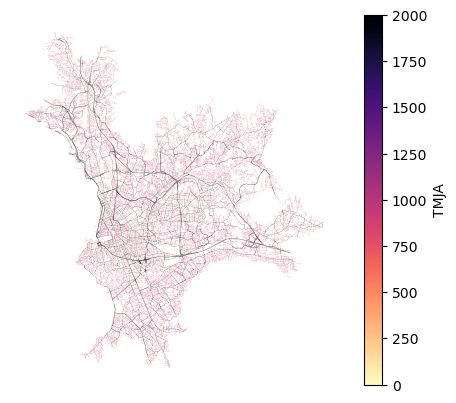

In [9]:
df.sort_values(by = 'tmja_tv', ascending=True).plot('tmja_tv', lw = .1, cmap = 'magma_r', legend=True, vmax = 2000, categorical = False, legend_kwds = {'label':'TMJA'})
plt.axis('off')

In [10]:
df.columns

Index(['objectid', 'axe', 'tmja_tv', 'tmja_vl', 'tmja_pl', 'tmja_2r',
       'vitesse', 'nb_voies', 'sens', 'largeur', 'nomcomm', 'codeinsee',
       'datemaj', 'source', 'source_int', 'specificites', 'type_rout',
       'codecomm', 'codesiret', 'nom_donnee', 'geo_point_2d', 'geometry'],
      dtype='object')

In [21]:
df.shape

(35925, 22)

In [22]:
# A lot of values 'light vehicles' are equal to 'all vehicles'
(df.tmja_vl == df.tmja_tv).sum()

29607

In [27]:
df.source.value_counts()

source
FORFAITAIRE     25667
ATMOSUD          8628
GESTIONNAIRE     1630
Name: count, dtype: int64

In [24]:
df[['nb_voies', 'sens', 'nb_voies', 'largeur', 'nomcomm', 'codeinsee',
       'datemaj', 'source', 'source_int', 'specificites', 'type_rout',
       'codecomm', 'codesiret', 'nom_donnee',]].head()

,nb_voies,sens,nb_voies,largeur,nomcomm,codeinsee,datemaj,source,source_int,specificites,type_rout,codecomm,codesiret,nom_donnee
0,2,Sens direct,2,6,Les Pennes-Mirabeau,13071,29/05/2020,GESTIONNAIRE,DGA Stratégie Environnementale,None,Départementale,None,None,None
1,2,Double sens,2,9,Les Pennes-Mirabeau,13071,29/05/2020,GESTIONNAIRE,DGA Stratégie Environnementale,None,Départementale,None,None,None
2,2,Double sens,2,9,Les Pennes-Mirabeau,13071,29/05/2020,GESTIONNAIRE,DGA Stratégie Environnementale,None,Départementale,None,None,None
3,2,Double sens,2,6,Les Pennes-Mirabeau,13071,29/05/2020,GESTIONNAIRE,DGA Stratégie Environnementale,None,Départementale,None,None,None
4,2,Double sens,2,6,Les Pennes-Mirabeau,13071,29/05/2020,GESTIONNAIRE,DGA Stratégie Environnementale,None,Départementale,None,None,None


In [8]:
df.sens.value_counts()

sens
Double sens     21232
Sens direct      3869
Sens inverse     2196
Name: count, dtype: int64

In [28]:
df.rename(columns = {
    'tmja_tv' : 'AADT', 
    #'tmja_vl', 
    'tmja_pl' : 'TR_AADT', 
    'tmja_2r' : '2W_AADT',
    'vitesse' : 'savg'
}, inplace=True)

In [29]:
df.shape[0]

35925

In [30]:
# A lot of values have being set to 800, let's remove it
df[df.AADT == 800].shape[0]

25065

In [31]:
df = df[df.AADT != 800]
df.shape[0]

10860

In [32]:
df.sens.value_counts()

sens
Sens direct     1172
Double sens      726
Sens inverse     334
Name: count, dtype: int64

In [33]:
# Sens inverse means "reversed" we have to invert the geometry coordinates
list(df[df.objectid == '24057'].geometry.values[0].coords)
# Going westward

[(5.415325124510691, 43.328972372930686),
 (5.415047864964323, 43.32903436617643),
 (5.414801095956174, 43.329088477729044),
 (5.414383583209494, 43.32918690157441)]

In [34]:
# df.loc[df.objectid == '24057'].explore()
# Going eastward

In [35]:
for k in tqdm(df.index):
    if df.loc[k].sens == 'Sens inverse':
        coords = list(df.loc[k].geometry.coords)
        # Revert coordinates
        df.loc[k, 'geometry'] = LineString(coords[::-1])

100%|██████████| 10860/10860 [00:00<00:00, 16197.52it/s]


In [36]:
list(df[df.objectid == '24057'].geometry.values[0].coords)

[(5.414383583209494, 43.32918690157441),
 (5.414801095956174, 43.329088477729044),
 (5.415047864964323, 43.32903436617643),
 (5.415325124510691, 43.328972372930686)]

(5.273265838623048, 5.62480876841258, 43.19726675759647, 43.45304350924522)

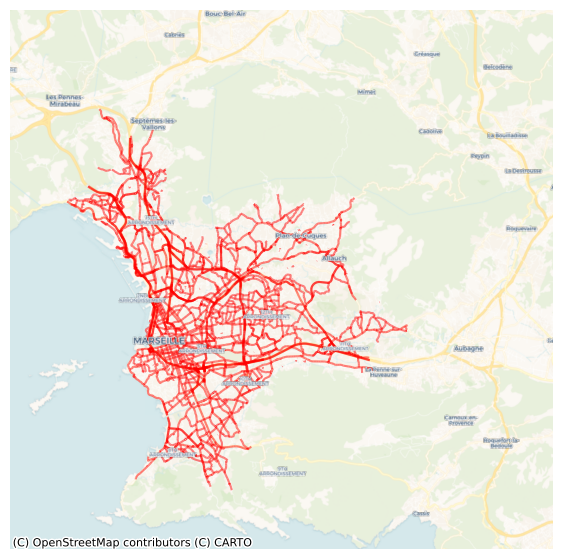

In [37]:
import contextily as cx

# Plot sensors
ax = df.plot(color = 'r', alpha = .5, figsize = (7,7))
# Add context in backround
cx.add_basemap(ax, crs = df.crs, source=cx.providers.CartoDB.VoyagerNoLabels)

cx.add_basemap(ax, crs = df.crs, source=cx.providers.CartoDB.VoyagerOnlyLabels)

# Remove lat lon
plt.axis('auto')
plt.axis('off')

# Map Matching with OSM

In [38]:

import sys
from pathlib import Path

# Add the ../assets directory to sys.path
sys.path.append(str(Path("../../assets").resolve()))

from map_matching_OSM import lines_matching

In [39]:
ml = []
for k in tqdm(df.index):
    if df.loc[k].geometry.geom_type != 'LineString':
        ml.append(k)
        print(k, df.loc[k].geometry.geom_type)

  0%|          | 0/10860 [00:00<?, ?it/s]

 55%|█████▌    | 6015/10860 [00:00<00:00, 27765.89it/s]

8693 MultiLineString
8744 MultiLineString
8821 MultiLineString
8823 MultiLineString
8858 MultiLineString
8921 MultiLineString
8935 MultiLineString
9183 MultiLineString
9184 MultiLineString
9185 MultiLineString
9186 MultiLineString
9187 MultiLineString
9188 MultiLineString
9189 MultiLineString
9849 MultiLineString
10075 MultiLineString
11307 MultiLineString
11309 MultiLineString
11310 MultiLineString
11311 MultiLineString
11312 MultiLineString


100%|██████████| 10860/10860 [00:00<00:00, 20315.11it/s]

32738 MultiLineString
32739 MultiLineString
32740 MultiLineString
32741 MultiLineString
32742 MultiLineString
32743 MultiLineString
32744 MultiLineString
32745 MultiLineString
32746 MultiLineString
32747 MultiLineString
33095 MultiLineString
33105 MultiLineString
33135 MultiLineString


In [40]:
df.drop(ml, inplace=True)

In [41]:
df = lines_matching(df)

Main graph loaded
Node 2038528383 not reachable from 2012305762
Node 2038528383 not reachable from 1996712284
Node 2038528383 not reachable from 2093964893
Node 2038528383 not reachable from 2101109128
Node 2038528383 not reachable from 2012305762
Node 2038528383 not reachable from 2093964893
Node 2038528383 not reachable from 1996712284
Node 2038528383 not reachable from 2093964893
Node 2038528383 not reachable from 2030530798
Node 2038528383 not reachable from 1996712284
Node 2038528383 not reachable from 2093964893
Node 2038528383 not reachable from 2101109128
Node 2038528383 not reachable from 2012305762
Node 2038528383 not reachable from 2093964893
Node 2038528383 not reachable from 1996712284
Node 2038528383 not reachable from 2093964893
Node 2038528383 not reachable from 2030530798
Node 2012305762 not reachable from 1375247792
Node 2101109128 not reachable from 1375247792
Node 1910662116 not reachable from 1375247792
Node 2012305762 not reachable from 1375247792
Node 2046450219 

In [42]:
# Here we don't have any street names to compare with
# gdf[['Street_name', 'closest_road']].values[:30]

In [43]:
df.columns

Index(['objectid', 'axe', 'AADT', 'tmja_vl', 'TR_AADT', '2W_AADT', 'savg',
       'nb_voies', 'sens', 'largeur', 'nomcomm', 'codeinsee', 'datemaj',
       'source', 'source_int', 'specificites', 'type_rout', 'codecomm',
       'codesiret', 'nom_donnee', 'geo_point_2d', 'geometry', 'osm_name',
       'osm_type', 'osm_lanes', 'osm_oneway', 'osmid'],
      dtype='object')

In [44]:
df.rename(columns={
    'nb_voies':'raw_lanes',
    'sens':'raw_oneway'
}, inplace=True)

In [47]:
df['raw_oneway'] = df.raw_oneway.apply(lambda x : False if x == 'Double sens' else True)

# Final saving

In [49]:
df[[
    'AADT', 'TR_AADT', '2W_AADT', 'savg', 'geometry', 'raw_oneway', 'raw_lanes', 'osm_name', 'osm_type','osm_lanes', 'osm_oneway', 'osmid'
]].to_file('treated/Marseille_AADT_2020.geojson', index = False)